In [1]:
#Working with a single file
import pyart
import os
import sys
from glob import glob
import platform
import copy
import netCDF4
import datetime
import numpy as np
from matplotlib import pyplot as plt
from boto.s3.connection import S3Connection

import tempfile

%matplotlib inline


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
import imp
lib_loc = os.path.join(os.path.expanduser('~'), 'cmdv_projects/houston/code/processing_code.py')
radar_codes = imp.load_source('radar_codes', lib_loc)


In [3]:
#Now our nifty fetch script
#Helper function for the search
def _nearestDate(dates, pivot):
    return min(dates, key=lambda x: abs(x - pivot))


def get_radar_from_aws(site, datetime_t):
    """
    Get the closest volume of NEXRAD data to a particular datetime.
    Parameters
    ----------
    site : string
        four letter radar designation
    datetime_t : datetime
        desired date time
    Returns
    -------
    radar : Py-ART Radar Object
        Radar closest to the queried datetime
    """

    # First create the query string for the bucket knowing
    # how NOAA and AWS store the data
    my_pref = datetime_t.strftime('%Y/%m/%d/') + site

    # Connect to the bucket
    conn = S3Connection(anon = True)
    bucket = conn.get_bucket('noaa-nexrad-level2')

    # Get a list of files
    bucket_list = list(bucket.list(prefix = my_pref))

    # we are going to create a list of keys and datetimes to allow easy searching
    keys = []
    datetimes = []

    # populate the list
    for i in range(len(bucket_list)):
        this_str = str(bucket_list[i].key)
        if 'gz' in this_str:
            endme = this_str[-22:-4]
            fmt = '%Y%m%d_%H%M%S_V0'
            dt = datetime_t.strptime(endme, fmt)
            datetimes.append(dt)
            keys.append(bucket_list[i])

        if this_str[-3::] == 'V06':
            endme = this_str[-19::]
            fmt = '%Y%m%d_%H%M%S_V06'
            dt = datetime_t.strptime(endme, fmt)
            datetimes.append(dt)
            keys.append(bucket_list[i])

    # find the closest available radar to your datetime
    closest_datetime = _nearestDate(datetimes, datetime_t)
    index = datetimes.index(closest_datetime)

    localfile = tempfile.NamedTemporaryFile()
    print(keys[index])
    keys[index].get_contents_to_filename(localfile.name)
    radar = pyart.io.read(localfile.name)
    return radar

In [5]:
# Lets grab the latest radar volume from Seattle
station = 'TJUA'
my_datetime = datetime.datetime(2017,9,6, 21, 48)
radar = get_radar_from_aws(station, my_datetime)

<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_214755_V06>


In [6]:
odir_images = '/data/images/'
print(radar.fields.keys())
radar_start_date = netCDF4.num2date(radar.time['data'][0],
        radar.time['units'])
print(radar_start_date)
ymd_string = datetime.datetime.strftime(radar_start_date, '%Y%m%d')
hms_string = datetime.datetime.strftime(radar_start_date, '%H%M%S')
lats = radar.gate_latitude
lons = radar.gate_longitude

im_output_location = os.path.join(odir_images,ymd_string)
if not os.path.exists(im_output_location):
    try:
        os.makedirs(im_output_location)
    except:
        print('looks like it is there! sneaky')


dict_keys(['spectrum_width', 'differential_phase', 'differential_reflectivity', 'velocity', 'reflectivity', 'cross_correlation_ratio'])
2017-09-06 21:47:55.982000


In [8]:
height = radar.gate_altitude
lats = radar.gate_latitude
lons = radar.gate_longitude
min_lon = lons['data'].min()
min_lat = lats['data'].min()
max_lat = lats['data'].max()
max_lon = lons['data'].max()

lat_lines = np.arange(min_lat, max_lat, 1)
lon_lines = np.arange(min_lon, max_lon, .1)
sw = 2


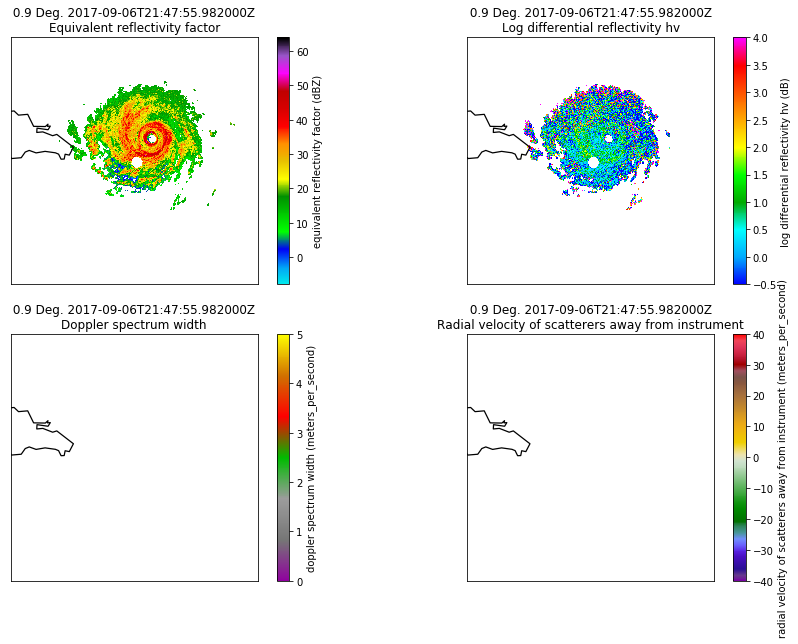

In [9]:
display = pyart.graph.RadarMapDisplay(radar)
f = plt.figure(figsize = [15,10])
plt.subplot(2, 2, 1)
display.plot_ppi_map('reflectivity', sweep = sw,
                     min_lon = min_lon, max_lon = max_lon,
                     min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l', vmin = -8, vmax = 64)
plt.subplot(2, 2, 2)
display.plot_ppi_map('differential_reflectivity', sweep = sw, vmin = -.5, vmax = 4,
                      min_lon = min_lon, max_lon = max_lon,
                      min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l')

plt.subplot(2, 2, 3)
display.plot_ppi_map('spectrum_width', sweep = sw, vmin =0, vmax =5.,
                     min_lon = min_lon, max_lon = max_lon,
                     min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l')
plt.subplot(2, 2, 4)
display.plot_ppi_map('velocity', sweep = sw,
                    vmin = -40, vmax = 40,
                      min_lon = min_lon, max_lon = max_lon,
                      min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l', cmap = pyart.graph.cm.Carbone42)

plt.savefig(os.path.join(im_output_location,
    'multi_'+ymd_string+hms_string+'.png'))


In [10]:
kdp_top = 10000.
coh_pwr = copy.deepcopy(radar.fields['differential_phase'])
coh_pwr['data'] = coh_pwr['data']*0.+1.
radar.fields['NCP'] = coh_pwr
phidp,kdp = pyart.correct.phase_proc_lp(radar,0.0,
                                      refl_field='reflectivity',
                                      LP_solver='cylp',
                                      ncp_field='NCP',
                                      rhv_field='cross_correlation_ratio',
                                      phidp_field='differential_phase',
                                      fzl = kdp_top,
                                      coef=.87,
                                      low_z=25., debug=True)
radar.fields['cylp_processed_phase'] = phidp
radar.fields['specific_differential_phase'] = kdp


Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  15.925673246383667
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16


In [11]:
print(radar.fields.keys())

dict_keys(['differential_reflectivity', 'reflectivity', 'spectrum_width', 'cross_correlation_ratio', 'differential_phase', 'velocity', 'NCP', 'unfolded_differential_phase', 'cylp_processed_phase', 'specific_differential_phase'])


In [15]:
height = radar.gate_altitude
lats = radar.gate_latitude
lons = radar.gate_longitude
min_lon = -68
min_lat = 18.
max_lat = 21.
max_lon = -64.
#18, -66
lat_lines = np.arange(min_lat, max_lat, .5)
lon_lines = np.arange(min_lon, max_lon, .5)
sw = 2


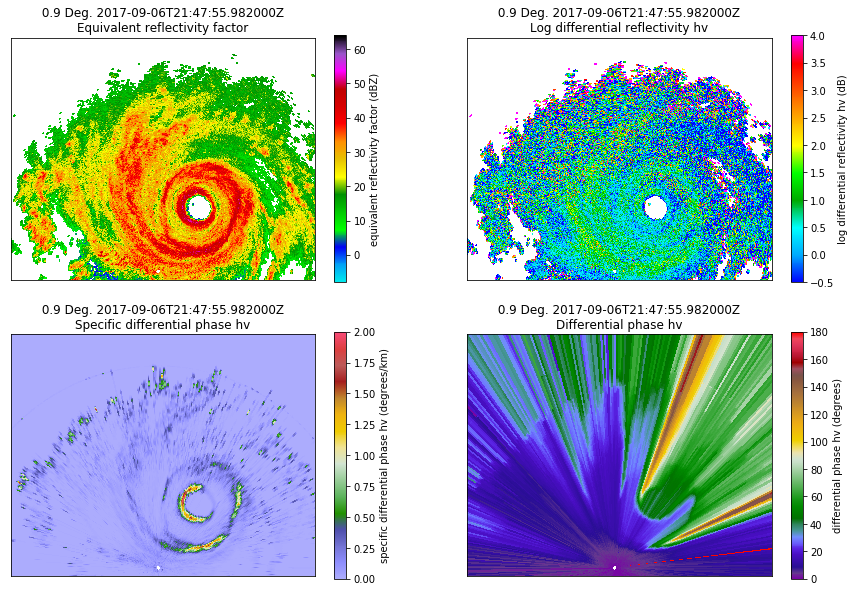

In [16]:
display = pyart.graph.RadarMapDisplay(radar)
f = plt.figure(figsize = [15,10])
plt.subplot(2, 2, 1)
display.plot_ppi_map('reflectivity', sweep = sw,
                     min_lon = min_lon, max_lon = max_lon,
                     min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l', vmin = -8, vmax = 64)
plt.subplot(2, 2, 2)
display.plot_ppi_map('differential_reflectivity', sweep = sw, vmin = -.5, vmax = 4,
                      min_lon = min_lon, max_lon = max_lon,
                      min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l')

plt.subplot(2, 2, 3)
display.plot_ppi_map('specific_differential_phase', sweep = sw, vmin =0, vmax = 2.,
                     min_lon = min_lon, max_lon = max_lon,
                     min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l')
plt.subplot(2, 2, 4)
display.plot_ppi_map('cylp_processed_phase', sweep = sw,
                    vmin = 0, vmax = 180,
                      min_lon = min_lon, max_lon = max_lon,
                      min_lat = min_lat, max_lat = max_lat,
                     resolution = 'l', cmap = pyart.graph.cm.Carbone42)

plt.savefig(os.path.join(im_output_location,
    'multi_'+ymd_string+hms_string+'.png'))


In [19]:
pyart.io.write_cfradial('/data/irma/irma_'+ymd_string+hms_string+'.nc', radar)

In [20]:
grids = pyart.map.grid_from_radars(radar,(31,801,801),
                   ((0.,15000.),(-200000.,200000.),(-200000.,200000.)),
                   fields=['differential_phase', 'differential_reflectivity', 
                           'cross_correlation_ratio', 'reflectivity', 'unfolded_differential_phase', 
                           'velocity', 'cylp_processed_phase', 'spectrum_width', 
                           'specific_differential_phase'],
                   refl_field='reflectivity',roi_func='dist_beam',
                   h_factor=0.,nb=0.6,bsp=1.,min_radius=200.)  

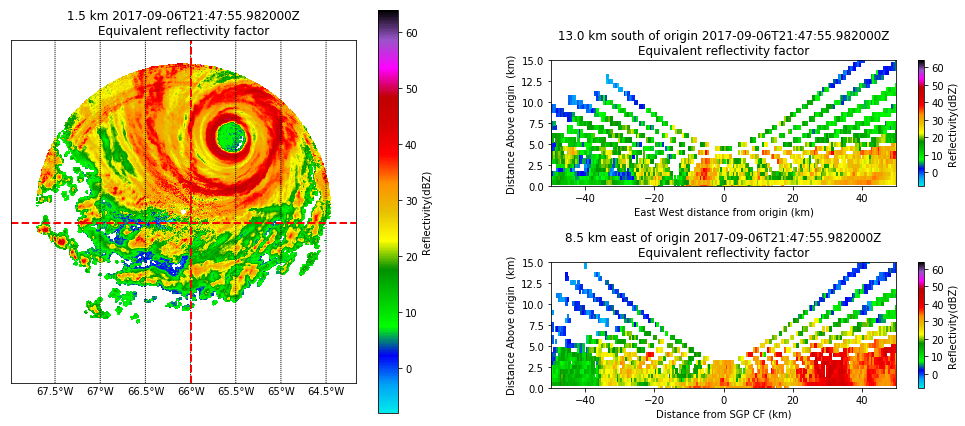

In [23]:
display = pyart.graph.GridMapDisplay(grids)
fig = plt.figure(figsize=[15, 7])

# panel sizes
map_panel_axes = [0.05, 0.05, .4, .80]
x_cut_panel_axes = [0.55, 0.10, .4, .25]
y_cut_panel_axes = [0.55, 0.50, .4, .25]

# parameters
level = 3
vmin = -8
vmax = 64
lat = 18
lon = -66

# panel 1, basemap, radar reflectivity and NARR overlay
ax1 = fig.add_axes(map_panel_axes)
display.plot_basemap(lon_lines = lon_lines, resolution='l' )
display.plot_grid('reflectivity', level=level, vmin=vmin, vmax=vmax,
                 cmap = pyart.graph.cm.NWSRef)
display.plot_crosshairs(lon=lon, lat=lat)

# panel 2, longitude slice.
ax2 = fig.add_axes(x_cut_panel_axes)
display.plot_longitude_slice('reflectivity', lon=lon, lat=lat, vmin=vmin, vmax=vmax,
                            cmap = pyart.graph.cm.NWSRef)
ax2.set_ylim([0,15])
ax2.set_xlim([-50,50])
ax2.set_xlabel('Distance from SGP CF (km)')

# panel 3, latitude slice
ax3 = fig.add_axes(y_cut_panel_axes)
ax3.set_ylim([0,15])
ax3.set_xlim([-50,50])
display.plot_latitude_slice('reflectivity', lon=lon, lat=lat, vmin=vmin, vmax=vmax,
                           cmap = pyart.graph.cm.NWSRef)
plt.savefig(os.path.join(im_output_location,
    'grid_'+ymd_string+hms_string+'.png'))


In [24]:
pyart.io.write_grid('/data/irma/irma_grid_'+ymd_string+hms_string+'.nc', grids)

2017-09-06 20:58:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_205540_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 20:55:40.335000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  16.76379108428955
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 21:08:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_211001_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 21:10:01.236000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  19.261884212493896
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 21:18:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_211938_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 21:19:38.186000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  15.513393878936768
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 21:28:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_212915_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 21:29:15.804000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  15.529546976089478
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 21:38:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_213829_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 21:38:29.411000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  15.703386783599854
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 21:48:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_214755_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 21:47:55.982000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  18.271946907043457
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 21:58:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_215727_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 21:57:27.826000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  18.982440948486328
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 22:08:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_220644_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 22:06:44.497000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  19.37168002128601
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 22:18:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_221611_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 22:16:11.061000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  16.05426001548767
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 22:28:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_222543_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 22:25:43.876000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  17.596446990966797
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16
2017-09-06 22:38:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_224004_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 22:40:04.683000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  18.875500917434692
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


2017-09-06 22:48:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_224927_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 22:49:27.372000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  20.408833026885986
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


2017-09-06 22:58:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_225904_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 22:59:04.167000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  17.195016860961914
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


2017-09-06 23:08:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_230840_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 23:08:40.855000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  20.143919706344604
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


2017-09-06 23:18:00
<Key: noaa-nexrad-level2,2017/09/06/TJUA/TJUA20170906_231817_V06>
dict_keys(['reflectivity', 'velocity', 'differential_reflectivity', 'cross_correlation_ratio', 'spectrum_width', 'differential_phase'])
2017-09-06 23:18:17.693000
Unfolding


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:188: RuntimeWarning: invalid value encountered in sqrt
  noise = smooth_and_trim(np.sqrt((line - signal) ** 2), window_len=wl)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:189: RuntimeWarning: divide by zero encountered in true_divide
  return abs(signal) / noise


Exec time:  15.33783507347107
Doing  0


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/pyart/correct/phase_proc.py:589: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.
  sct[np.where(sct < 0.0)] = 0.0


Doing  1
Doing  2
Doing  3
Doing  4
Doing  5
Doing  6
Doing  7
Doing  8
Doing  9
Doing  10
Doing  11
Doing  12
Doing  13
Doing  14
Doing  15
Doing  16


/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/scollis/anaconda3/envs/cmac_env/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


2017-09-06 23:28:00


BotoServerError: BotoServerError: 503 Slow Down


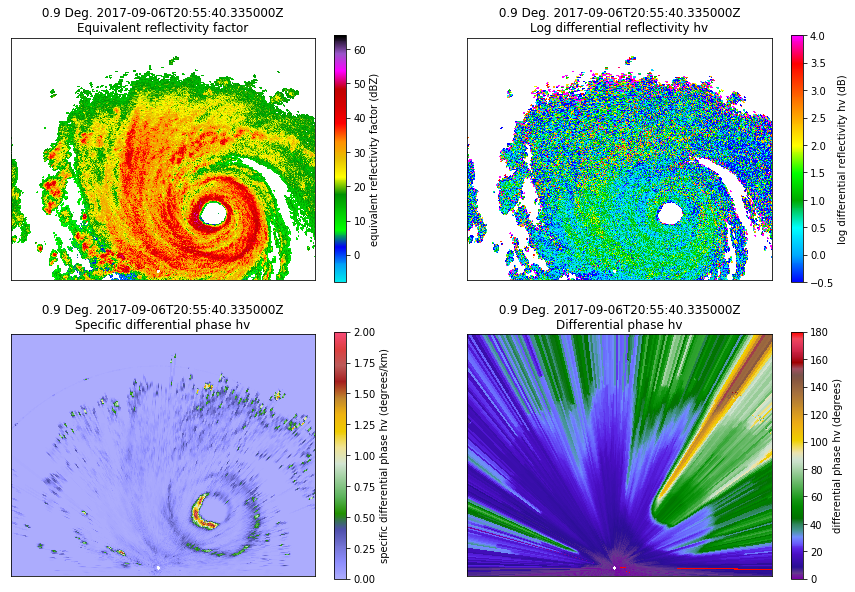

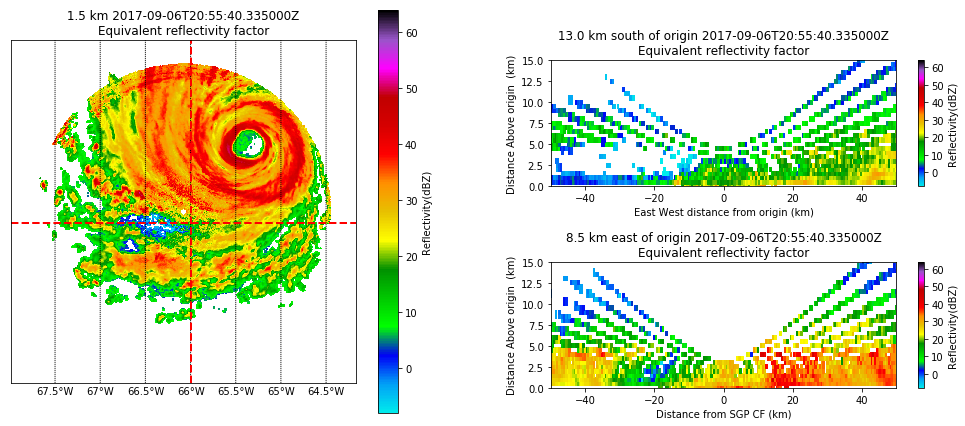

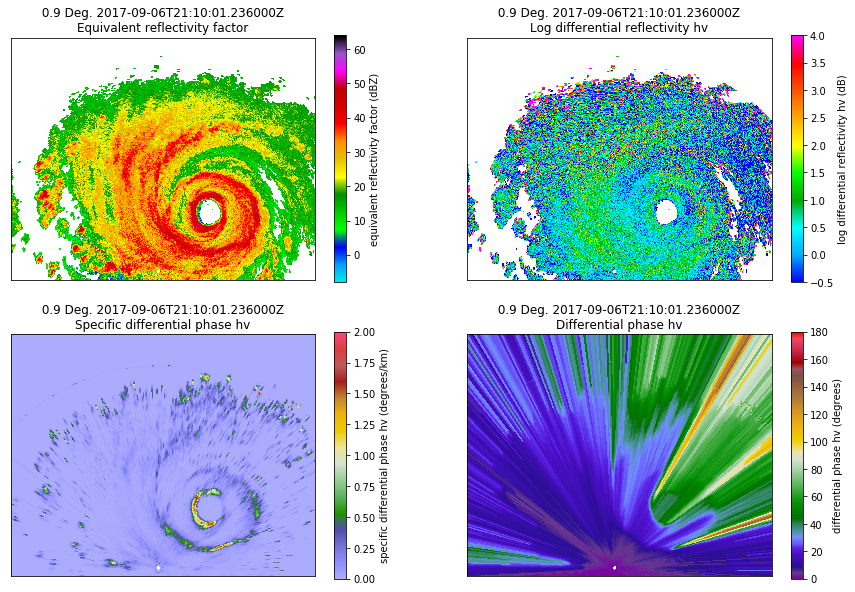

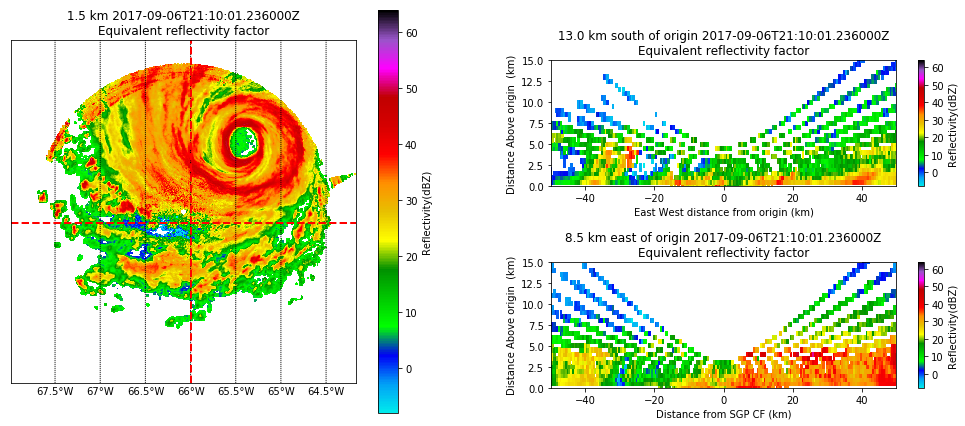

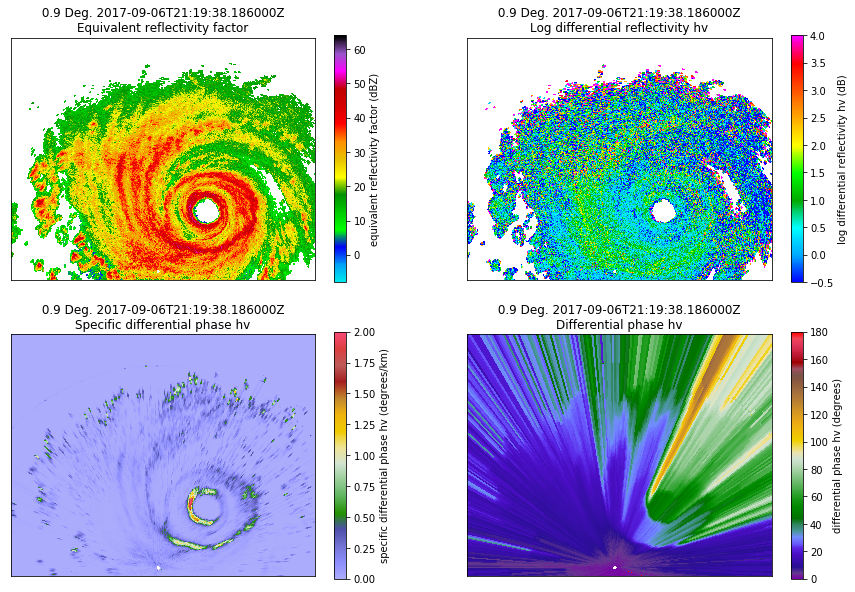

...

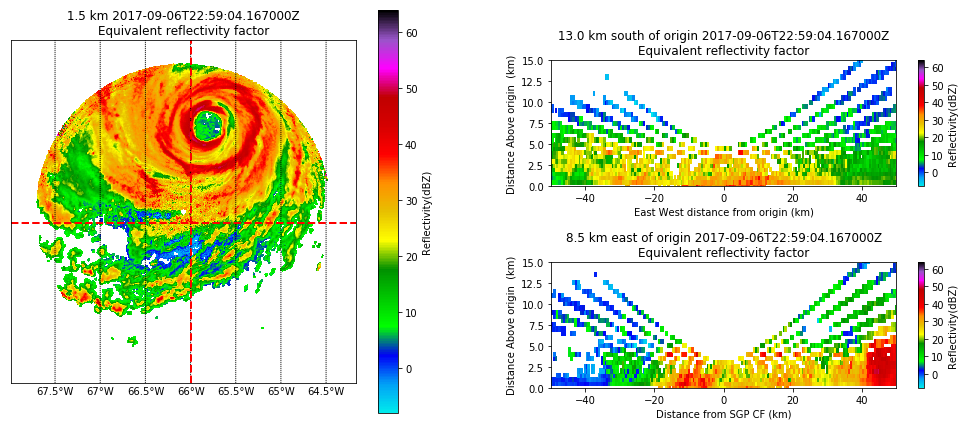

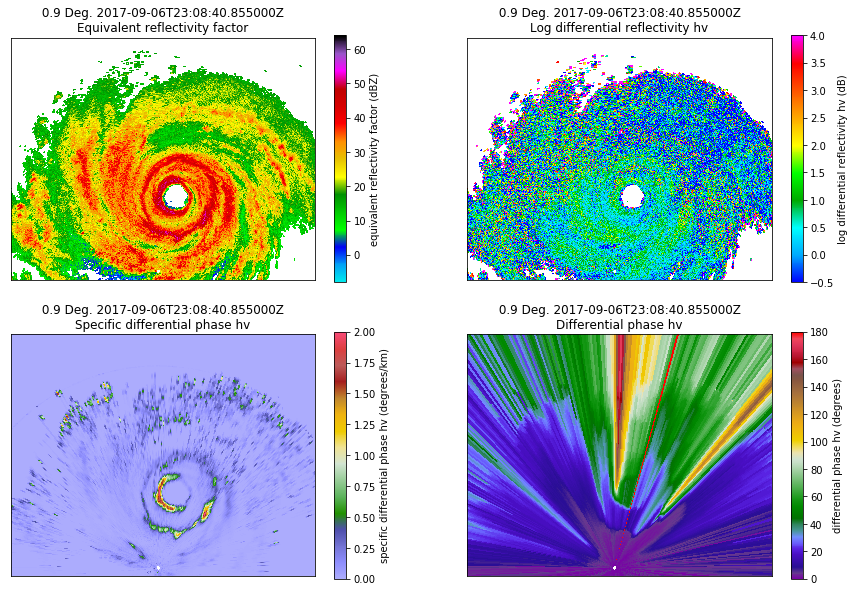

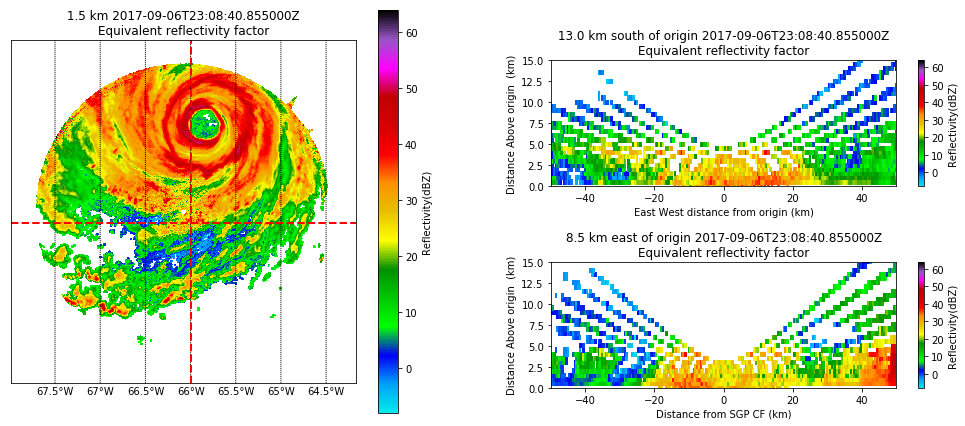

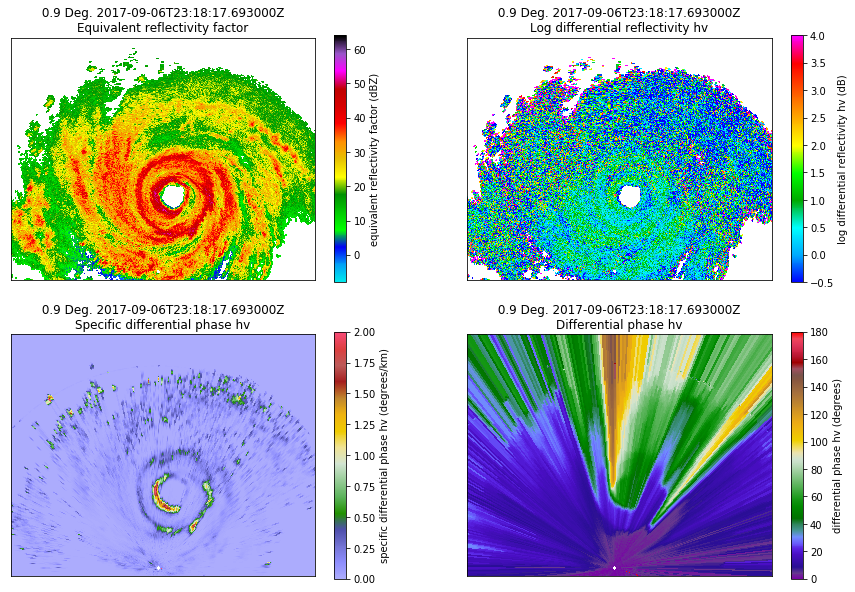

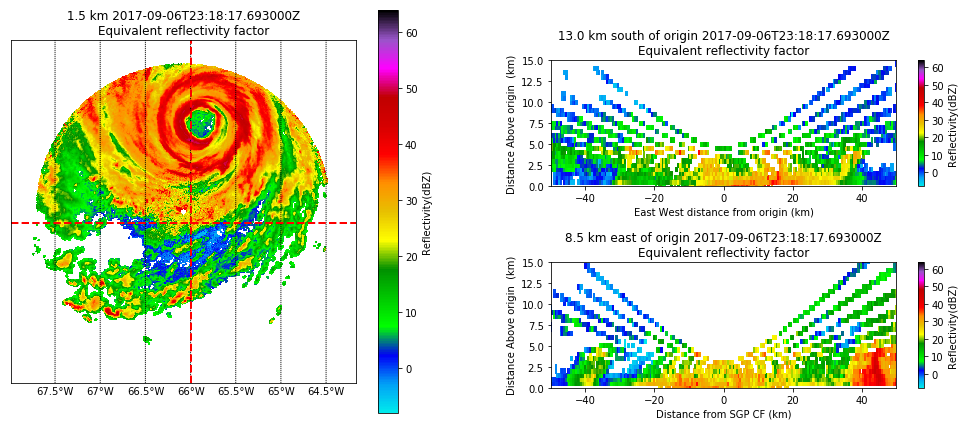

In [10]:
for delta in range(35):
    # Lets grab the latest radar volume from Seattle
    station = 'TJUA'
    my_datetime = datetime.datetime(2017,9,6, 20, 48) + datetime.timedelta(minutes = (delta + 1 ) * 10)
    print(my_datetime)
    radar = get_radar_from_aws(station, my_datetime)
    
    odir_images = '/data/images/'
    print(radar.fields.keys())
    radar_start_date = netCDF4.num2date(radar.time['data'][0],
            radar.time['units'])
    print(radar_start_date)
    ymd_string = datetime.datetime.strftime(radar_start_date, '%Y%m%d')
    hms_string = datetime.datetime.strftime(radar_start_date, '%H%M%S')
    lats = radar.gate_latitude
    lons = radar.gate_longitude

    im_output_location = os.path.join(odir_images,ymd_string)
    if not os.path.exists(im_output_location):
        try:
            os.makedirs(im_output_location)
        except:
            print('looks like it is there! sneaky')
    kdp_top = 10000.
    coh_pwr = copy.deepcopy(radar.fields['differential_phase'])
    coh_pwr['data'] = coh_pwr['data']*0.+1.
    radar.fields['NCP'] = coh_pwr
    phidp,kdp = pyart.correct.phase_proc_lp(radar,0.0,
                                          refl_field='reflectivity',
                                          LP_solver='cylp',
                                          ncp_field='NCP',
                                          rhv_field='cross_correlation_ratio',
                                          phidp_field='differential_phase',
                                          fzl = kdp_top,
                                          coef=.87,
                                          low_z=25., debug=True)
    radar.fields['cylp_processed_phase'] = phidp
    radar.fields['specific_differential_phase'] = kdp
    height = radar.gate_altitude
    lats = radar.gate_latitude
    lons = radar.gate_longitude
    min_lon = -68
    min_lat = 18.
    max_lat = 21.
    max_lon = -64.
    #18, -66
    lat_lines = np.arange(min_lat, max_lat, .5)
    lon_lines = np.arange(min_lon, max_lon, .5)
    sw = 2
    display = pyart.graph.RadarMapDisplay(radar)
    f = plt.figure(figsize = [15,10])
    plt.subplot(2, 2, 1)
    display.plot_ppi_map('reflectivity', sweep = sw,
                         min_lon = min_lon, max_lon = max_lon,
                         min_lat = min_lat, max_lat = max_lat,
                         resolution = 'l', vmin = -8, vmax = 64)
    plt.subplot(2, 2, 2)
    display.plot_ppi_map('differential_reflectivity', sweep = sw, vmin = -.5, vmax = 4,
                          min_lon = min_lon, max_lon = max_lon,
                          min_lat = min_lat, max_lat = max_lat,
                         resolution = 'l')

    plt.subplot(2, 2, 3)
    display.plot_ppi_map('specific_differential_phase', sweep = sw, vmin =0, vmax = 2.,
                         min_lon = min_lon, max_lon = max_lon,
                         min_lat = min_lat, max_lat = max_lat,
                         resolution = 'l')
    plt.subplot(2, 2, 4)
    display.plot_ppi_map('cylp_processed_phase', sweep = sw,
                        vmin = 0, vmax = 180,
                          min_lon = min_lon, max_lon = max_lon,
                          min_lat = min_lat, max_lat = max_lat,
                         resolution = 'l', cmap = pyart.graph.cm.Carbone42)

    plt.savefig(os.path.join(im_output_location,
        'multi_'+ymd_string+hms_string+'.png'))

    pyart.io.write_cfradial('/data/irma/irma_'+ymd_string+hms_string+'.nc', radar)

    grids = pyart.map.grid_from_radars(radar,(31,801,801),
                       ((0.,15000.),(-200000.,200000.),(-200000.,200000.)),
                       fields=['differential_phase', 'differential_reflectivity', 
                               'cross_correlation_ratio', 'reflectivity', 'unfolded_differential_phase', 
                               'velocity', 'cylp_processed_phase', 'spectrum_width', 
                               'specific_differential_phase'],
                       refl_field='reflectivity',roi_func='dist_beam',
                       h_factor=0.,nb=0.6,bsp=1.,min_radius=200.)  

    display = pyart.graph.GridMapDisplay(grids)
    fig = plt.figure(figsize=[15, 7])

    # panel sizes
    map_panel_axes = [0.05, 0.05, .4, .80]
    x_cut_panel_axes = [0.55, 0.10, .4, .25]
    y_cut_panel_axes = [0.55, 0.50, .4, .25]

    # parameters
    level = 3
    vmin = -8
    vmax = 64
    lat = 18
    lon = -66

    # panel 1, basemap, radar reflectivity and NARR overlay
    ax1 = fig.add_axes(map_panel_axes)
    display.plot_basemap(lon_lines = lon_lines, resolution='l' )
    display.plot_grid('reflectivity', level=level, vmin=vmin, vmax=vmax,
                     cmap = pyart.graph.cm.NWSRef)
    display.plot_crosshairs(lon=lon, lat=lat)

    # panel 2, longitude slice.
    ax2 = fig.add_axes(x_cut_panel_axes)
    display.plot_longitude_slice('reflectivity', lon=lon, lat=lat, vmin=vmin, vmax=vmax,
                                cmap = pyart.graph.cm.NWSRef)
    ax2.set_ylim([0,15])
    ax2.set_xlim([-50,50])
    ax2.set_xlabel('Distance from SGP CF (km)')

    # panel 3, latitude slice
    ax3 = fig.add_axes(y_cut_panel_axes)
    ax3.set_ylim([0,15])
    ax3.set_xlim([-50,50])
    display.plot_latitude_slice('reflectivity', lon=lon, lat=lat, vmin=vmin, vmax=vmax,
                               cmap = pyart.graph.cm.NWSRef)
    plt.savefig(os.path.join(im_output_location,
        'grid_'+ymd_string+hms_string+'.png'))
    pyart.io.write_grid('/data/irma/irma_grid_'+ymd_string+hms_string+'.nc', grids)
